## Download the required files and store them in a single directory

This catalog_path directory should contain: 
  1. The master catalog from https://cosmos2025.iap.fr/catalog.html
  2. The SCI Tarballs of all tiles at 30 mas pixel scale for the four NIRCam bands F115W, F150W, F277W, and F444W. https://cosmos2025.iap.fr/nircam.html#downloads

In [1]:
catalog_path = r"C:/Users/cputh/Documents/COSMOSWeb/"
master_catalog = 'COSMOSWeb_mastercatalog_v1.fits'

## Applying cuts to the master catalog

In [2]:
import os
import numpy as np
from astropy.table import Table
from astropy.nddata import Cutout2D
from astropy.io import fits
from astropy import units as u

import tarfile
import gzip
import warnings

warnings.filterwarnings('ignore')

from lenstronomy.Util.param_util import ellipticity2phi_q

band_list = ["f115w", "f150w", "f277w", "f444w"]

In [3]:
def process_catalog(master_catalog_path, max_z, min_radius, max_radius, faintest_apparent_mag):
    """This function filters out sources in the catalog so that only
    galaxies with high SNR remain. Thus, we perform the following cuts:

    1. redshift < max_z
    2. major axis sersic radius > min_radius (arcseconds)
    3. major axis sersic radius < max radius (arcseconds)
    4. AB magnitude < faintest_apparent_mag in all of the following bands:
        F115W, F150W, F277W, F444W
    5. Remove galaxies with nearby contaminants (contaminants must be further than D away,
        where D is five times the major axis sersic radius of each source)

    :param master_catalog_path: path to the COSMOSWeb_mastercatalog_v1.fits file.
        This catalog can be downloaded from https://cosmos2025.iap.fr/catalog.html
    :type master_catalog_path: string
    :return: merged astropy table with only high SNR galaxies.
        This astropy table is the same as the one that comes with the catalog,
        but with some columns renamed for clarity, and extraneous columns removed.
    """

    photometry_table = Table.read(master_catalog_path, format="fits", hdu=1)

    sources_with_contaminants = find_sources_with_contaminants(photometry_table)

    lephare_table = Table.read(master_catalog_path, format="fits", hdu=2)
    photometry_table, lephare_table = apply_cuts(
        photometry_table,
        lephare_table,
        max_z,
        min_radius,
        max_radius,
        faintest_apparent_mag,
        sources_with_contaminants,
    )
    photometry_table = rewrite_and_discard_columns(photometry_table, lephare_table)

    return photometry_table

#-----------------------------------------------------------------------------------------------------------------------------

def find_sources_with_contaminants(photometry_table):
    """Finds all sources that have a nearby contaminant."""

    sources_with_contaminants = []
    
    for tile in list(set(photometry_table['tile'])):
        tiled_table = photometry_table[photometry_table['tile'] == tile]
        x = tiled_table['x_image'].data
        y = tiled_table['y_image'].data
        major_radius = tiled_table['radius_sersic'].data * 3600 / 0.03

        # Compute pairwise distances N pairs at a time; very slow and inefficient
        # Can't use scipy's pdist due to memory issues (too many pairs)
        for i in range(len(tiled_table)):
            distances = np.sqrt((x - x[i])**2 + (y - y[i])**2)

            if np.any(np.delete(distances, i) < (4 * major_radius[i])):
                id = tiled_table['id'][i]
                sources_with_contaminants.append(id)

    return np.array(sources_with_contaminants, dtype=np.int32)

#-----------------------------------------------------------------------------------------------------------------------------

def apply_cuts(
    photometry_table,
    lephare_table,
    max_z,
    min_radius,
    max_radius,
    faintest_apparent_mag,
    sources_with_contaminants,
):
    """This function filters out sources in the catalog so that only
    galaxies with high SNR remain. Thus, we perform the following cuts:

    1. redshift < max_z
    2. major axis sersic radius > min_radius (arcseconds)
    3. major axis sersic radius < max_radius (arcseconds)
    4. AB magnitude < faintest_apparent_mag in all of the following bands:
        F115W, F150W, F277W, F444W
    5. Remove galaxies with nearby contaminants
    """
    is_ok = np.ones(len(lephare_table), dtype=bool)

    # filters out sources with artifacts/issues
    # see https://cosmos2025.iap.fr/catalog.html#quality-flags for warn_flag documentation
    is_ok &= photometry_table["warn_flag"].data == 0

    # redshift cut
    if max_z is not None:
        is_ok &= lephare_table["zfinal"].data < max_z

    # minimum size cut
    # convert catalog value from deg to arcseconds
    if min_radius is not None:
        is_ok &= (photometry_table['radius_sersic'].data * 3600) > min_radius

    # maximum size cut
    # convert catalog value from deg to arcseconds
    if max_radius is not None:
        is_ok &= (photometry_table['radius_sersic'].data * 3600) < max_radius

    # Some galaxies have their redshifts in the catalog set to -99
    # The documentation does not explain why; we filter these galaxies out
    is_ok &= lephare_table["zfinal"].data != -99

    # only includes galaxies
    # type = 0 is galaxies, type = 1 is stars, type = 2 is QSOs
    is_ok &= lephare_table["type"].data == 0

    # magnitude cuts
    for band in [
        "mag_auto_f115w",
        "mag_auto_f150w",
        "mag_auto_f277w",
        "mag_auto_f444w",
    ]:
        is_ok &= photometry_table[band].data < faintest_apparent_mag

    # remove sources with nearby contaminants
    is_ok &= np.invert(np.isin(photometry_table['id'].data, sources_with_contaminants))

    photometry_table = photometry_table[is_ok]
    lephare_table = lephare_table[is_ok]

    return photometry_table, lephare_table

#-----------------------------------------------------------------------------------------------------------------------------

def rewrite_and_discard_columns(photometry_table, lephare_table):

    # The catalog has different ellipticity conventions; we overwrite them here with the lenstronomy convention
    e1 = np.array(photometry_table["e2"], dtype=np.float64)
    e2 = np.array(photometry_table["e1"], dtype=np.float64)
    phi, q = ellipticity2phi_q(e1=e1, e2=e2)
    photometry_table["sersic_angle"] = phi
    photometry_table["axis_ratio"] = q

    # convert from degrees to arcseconds and rename
    photometry_table["radius_sersic"] = (
        photometry_table["radius_sersic"].data * 3600
    )
    photometry_table.rename_column("radius_sersic", "sersic_radius")

    photometry_table.rename_column("fmf_chi2", "sersic_fit_chi2")
    photometry_table.rename_column("sersic", "sersic_index")

    photometry_table["z"] = lephare_table["zfinal"]

    # Add units to table
    photometry_table['sersic_radius'].unit = u.arcsec
    photometry_table['sersic_angle'].unit = u.rad

    # drop extraneous data
    keep_columns = [
        "id",
        "sersic_index",  # sersic index n
        "axis_ratio",  # axis ratio q
        "sersic_angle",  # radians, measured from East to North
        "sersic_radius",  # major axis sersic radius in arcseconds
        "z", # redshift
        "sersic_fit_chi2", # chi2 of the sersic fit
        # -------------------------------------------------------------------------------
        # These will be deleted later
        "tile",
        "x_image",  # coordinates of the source on the detection image in units of pixels
        "y_image",  # coordinates of the source on the detection image in units of pixels
    ]

    for col in photometry_table.colnames:
        if col not in keep_columns:
            photometry_table.remove_column(col)

    return photometry_table

In [4]:
# This takes several minutes
master_catalog_path = os.path.join(catalog_path, master_catalog)
processed_catalog = process_catalog(
    master_catalog_path,
    max_z=None,
    min_radius=0.15, # 5 pixels
    max_radius=None,
    faintest_apparent_mag=21,
)

print(len(processed_catalog))

2763


## Extract and save all cutout images in downselected catalog

The following tar files should be inside of your catalog_path directory:
1. mosaic_nircam_f115w_COSMOS-Web_30mas_all_v1.0_sci.tar.gz
2. mosaic_nircam_f150w_COSMOS-Web_30mas_all_v1.0_sci.tar.gz
3. mosaic_nircam_f277w_COSMOS-Web_30mas_all_v1.0_sci.tar.gz
4. mosaic_nircam_f444w_COSMOS-Web_30mas_all_v1.0_sci.tar.gz

Note: These .tar.gz extensions are misleading and the tar archives are not actually gzipped.

In [5]:
def extract_cutout_images(tile):

    images = {}

    # some images have the source located at the edge of the detector
    # keep track of them and we'll discard them at the end
    sources_on_edge = []

    for band in ["f115w", "f150w", "f277w", "f444w"]:

        tar_name = f"mosaic_nircam_{band}_COSMOS-Web_30mas_all_v1.0_sci.tar.gz"

        # Open the tarball
        with tarfile.open(os.path.join(catalog_path, tar_name), 'r') as tar:
        
            file_name = f"mosaic_nircam_{band}_COSMOS-Web_30mas_{tile}_v1.0_sci.fits.gz"
            # Open the FITS file as a file-like object
            with tar.extractfile(file_name) as fits_gz_file:
            
                # Decompress the file-like .gz object into a file
                with gzip.open(fits_gz_file) as fits_file:
                
                    hdul = fits.open(fits_file)
                    data = hdul[0].data     # 1.78 GB
                    hdul.close()

        for entry in processed_catalog[processed_catalog['tile'] == tile]:
            if entry['id'] in sources_on_edge:
                continue

            if entry['id'] not in images:
                images[entry['id']] = {}

            cutout_size = int(5.5 * entry['sersic_radius'] / 0.03)
            if cutout_size % 2 == 0:
                cutout_size += 1

            coords = np.array([entry["x_image"], entry["y_image"]])
            image = Cutout2D(data, tuple(coords), cutout_size).data

            # checks if the source is located at the edge of the detector
            # the image will have a bunch of zeros
            # Also gets rid of images with weird zero-value pixel artifacts like source 8290
            if np.any(image == 0):
                sources_on_edge.append(entry['id'])
                del images[entry['id']]
            else:
                images[entry['id']][band] = image
                
        # Frees up memory before the next iteration
        del data

    return images, sources_on_edge

In [6]:
def delete_id_from_catalog(id_list, catalog):
    for id in id_list:
        catalog = catalog[catalog['id'] != id]

    return catalog

In [7]:
def save_cutout_images_to_fits(images, output_file_directory):
    for id in images.keys():
        hdu_list = []
        hdu_list.append(fits.PrimaryHDU())

        for band in band_list:
            hdu_list.append(fits.ImageHDU(data=images[id][band], name=band))

        output_filename = f"COSMOSWeb_galaxy_{id}_image.fits"
        output_file = os.path.join(output_file_directory, output_filename)
        
        hdu_list = fits.HDUList(hdu_list)
        hdu_list.writeto(output_file, overwrite=True)
        hdu_list.close()

Extract cutouts and save images one tile at a time to reduce RAM usage. This takes 30-45 minutes

In [8]:
output_file_directory = r"C:/Users/cputh/Documents/COSMOSWeb_galaxy_catalog/"

In [9]:
for tile in ["A1", "A2", "A3", "A4", "A5", "A6", "A7", "A8", "A9", "A10", "B1", "B2", "B3", "B4", "B5", "B6", "B7", "B8", "B9", "B10"]:
    print(tile)
    
    images, sources_on_edge = extract_cutout_images(tile=tile)
    processed_catalog = delete_id_from_catalog(sources_on_edge, processed_catalog)
    save_cutout_images_to_fits(images=images, output_file_directory=output_file_directory)

    # Frees up memory before the next iteration
    del images

A1
A2
A3
A4
A5
A6
A7
A8
A9
A10
B1
B2
B3
B4
B5
B6
B7
B8
B9
B10


Save catalog as a fits file

In [10]:
output_file = os.path.join(output_file_directory, "COSMOSWeb_galaxy_catalog.fits")

delete_columns = [
    "tile",
    "x_image",
    "y_image",
]

for col in processed_catalog.colnames:
    if col in delete_columns:
        processed_catalog.remove_column(col)

processed_catalog.write(output_file, format='fits', overwrite=True)
processed_catalog

id,sersic_radius,sersic_index,sersic_fit_chi2,sersic_angle,axis_ratio,z
,arcsec,,,rad,,
int64,float64,float64,float64,float64,float64,float64
286,0.3042519122612226,1.5540936181683476,72.8528823852539,0.08868179445460957,0.7894440050667578,0.332
360,0.3826302623289842,2.610399486598715,234.08677673339844,-0.6906150051422545,0.3113210237124925,0.35
361,0.7684636846216464,7.715222391914014,466.2574462890625,0.7504414140464735,0.8248926336139187,0.3499
780,0.3780120237756534,3.117995787906508,458.81512451171875,1.5146493718192056,0.6351300359428074,0.3532
858,0.35698750616040975,4.5601973885475875,152.9873504638672,-0.946176944514633,0.8545060607527021,0.6635
884,0.5056299607590149,2.8654582937048887,117.88330078125,0.5259757533315781,0.33021922816009924,0.3575
1313,0.4958568876181756,2.0427439151081295,108.77323150634766,1.5628004805971472,0.4244042370252128,0.606
1368,0.4531281883670682,1.3908926019366394,45.255401611328125,-0.7757946621783576,0.36505183306261185,0.3224


In [11]:
output_tar = r"C:/Users/cputh/Documents/COSMOSWeb_galaxy_catalog_v2.tar.gz"

def save_catalog_as_tar(output_tar):
    with tarfile.open(output_tar, "w:gz") as tar:
        tar.add(output_file_directory, arcname=r"COSMOSWeb_galaxy_catalog/")

save_catalog_as_tar(output_tar)

# Montage of sources

### Band specific images

sersic radius 0.3042519122612226
id 286


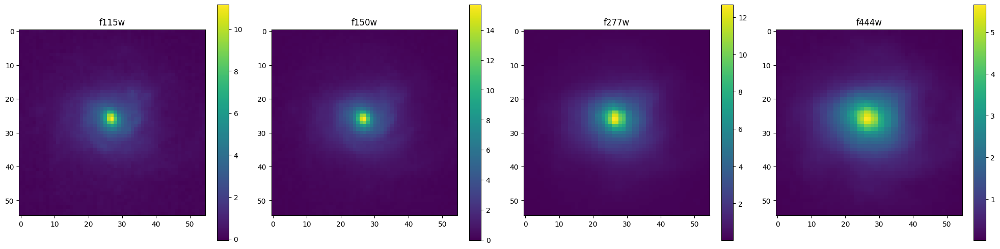

sersic radius 0.3826302623289842
id 360


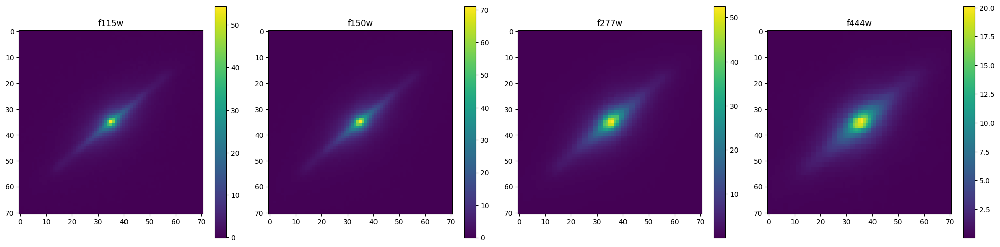

sersic radius 0.7684636846216464
id 361


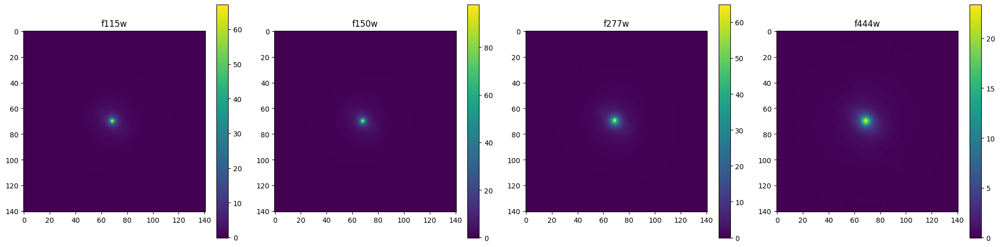

sersic radius 0.3780120237756534
id 780


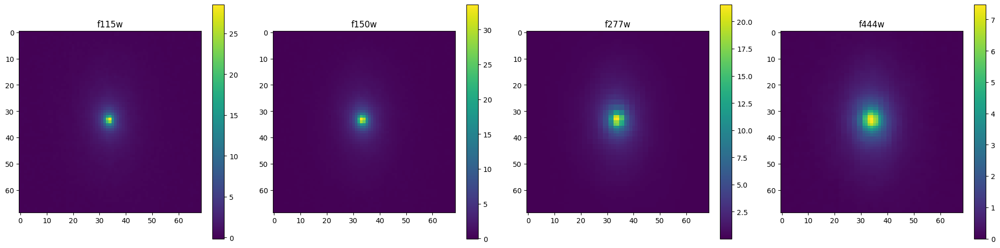

sersic radius 0.35698750616040975
id 858


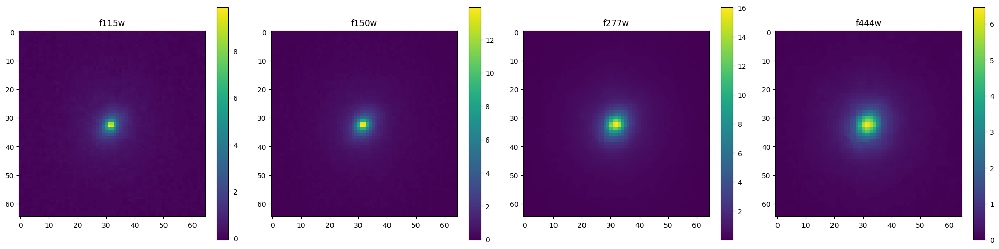

sersic radius 0.5056299607590149
id 884


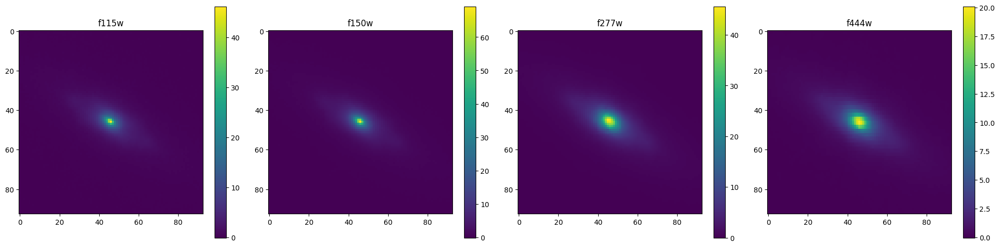

sersic radius 0.4958568876181756
id 1313


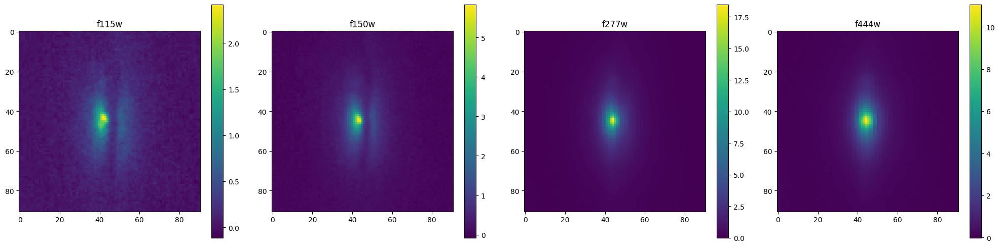

sersic radius 0.4531281883670682
id 1368


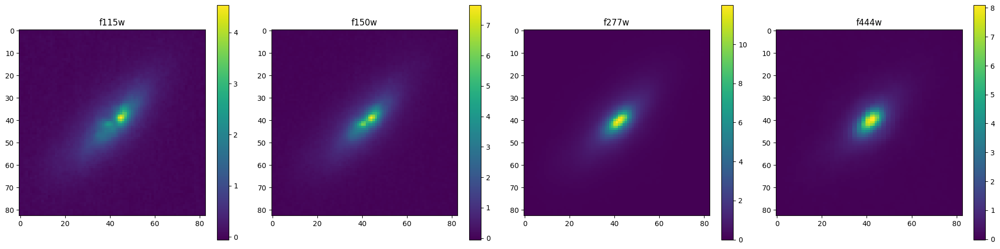

sersic radius 0.3950885896030016
id 2852


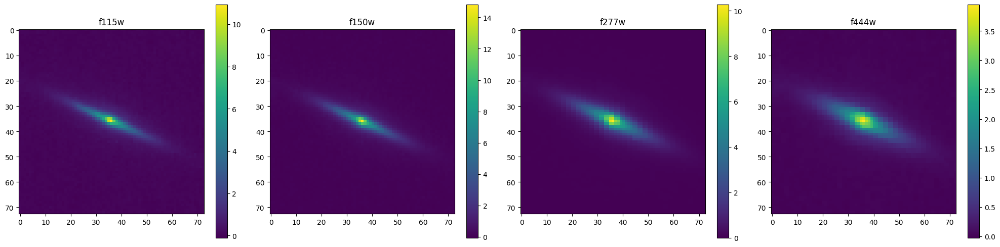

sersic radius 0.2631974591203016
id 3456


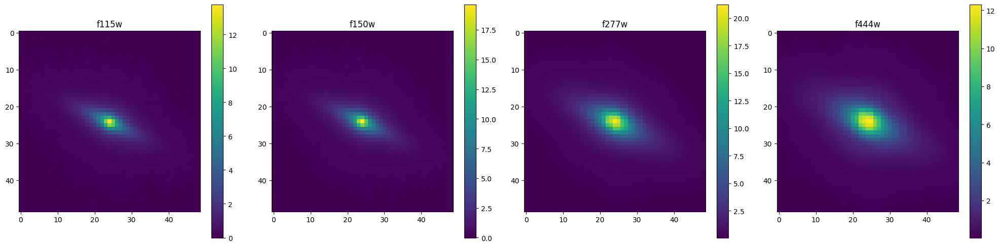

sersic radius 0.5420378389922488
id 3555


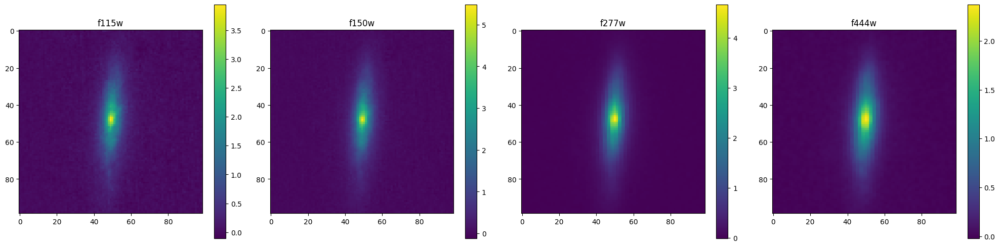

sersic radius 0.510107795177343
id 3676


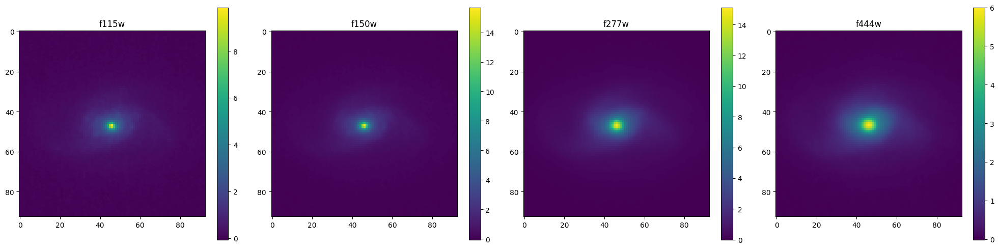

sersic radius 0.3203001258751406
id 3707


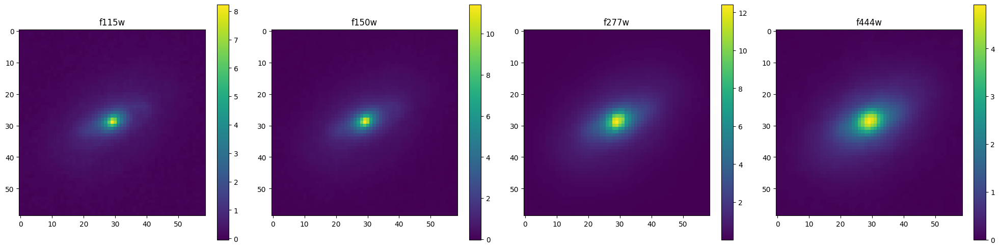

sersic radius 0.33448514584040473
id 3711


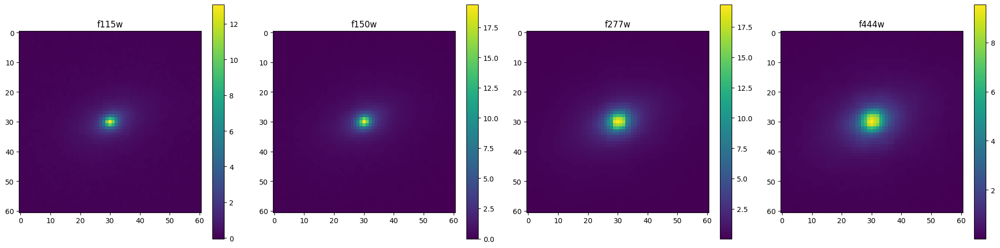

sersic radius 0.9214056003897172
id 4882


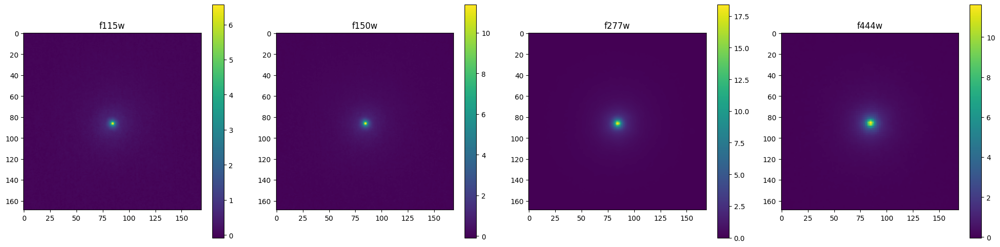

sersic radius 0.35675962609373707
id 5029


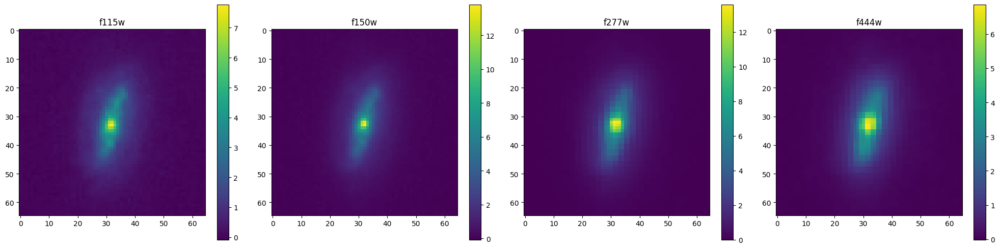

sersic radius 0.41393227048709264
id 5156


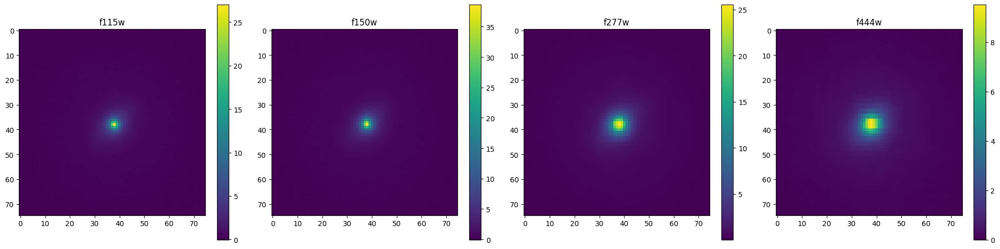

sersic radius 0.6093406901965285
id 5241


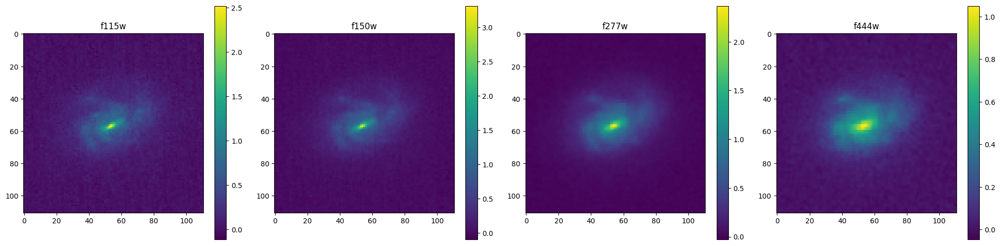

sersic radius 0.6307494458931748
id 5347


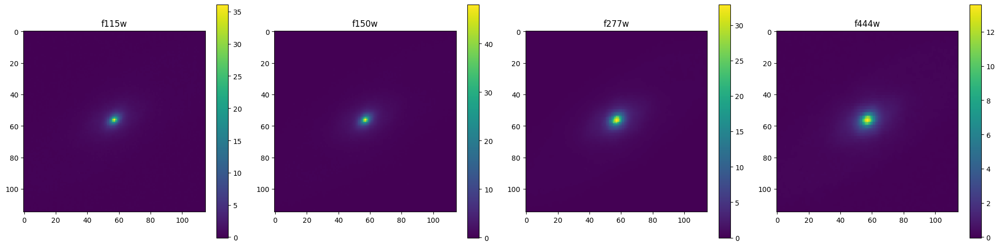

sersic radius 0.5402706266132574
id 5440


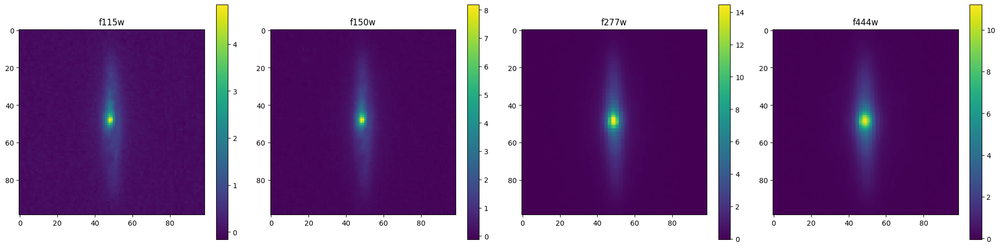

sersic radius 0.36406285455147813
id 5452


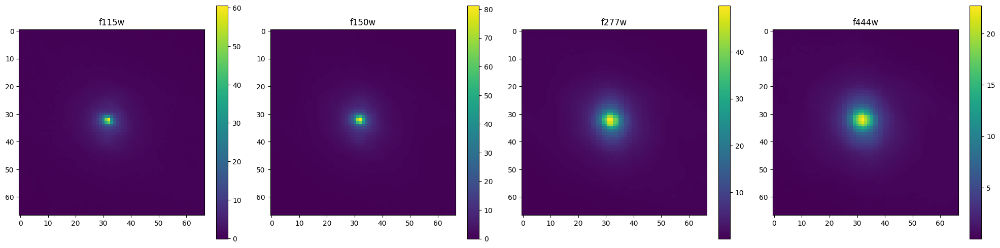

sersic radius 0.5742039954845403
id 5597


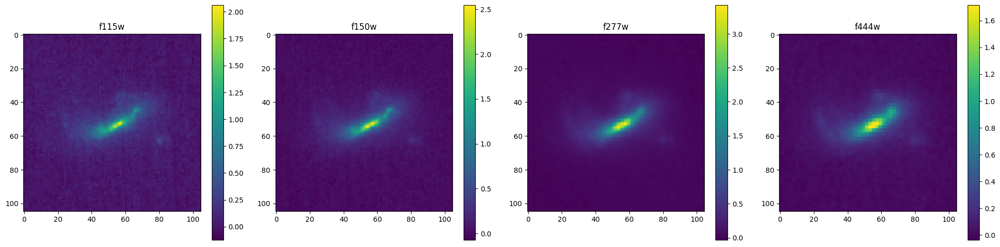

sersic radius 0.20570351452593236
id 5720


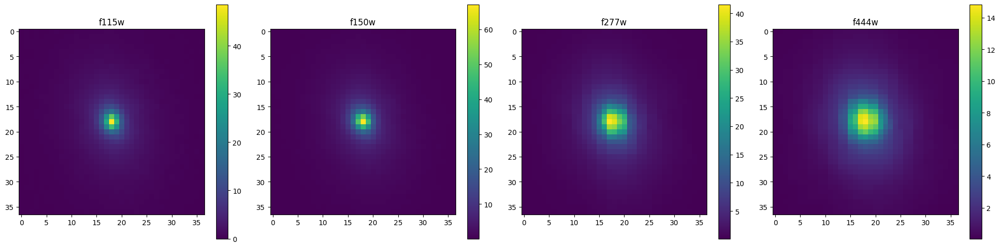

sersic radius 0.8770085129227821
id 6173


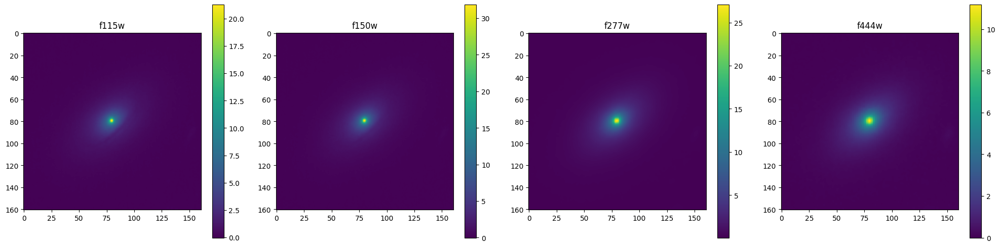

sersic radius 0.2571134997278226
id 6608


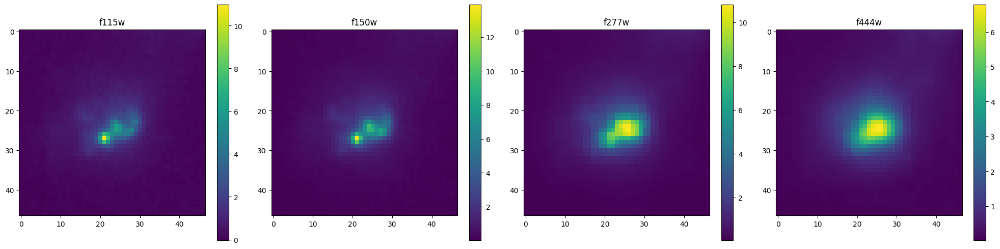

sersic radius 0.2652957873111927
id 6611


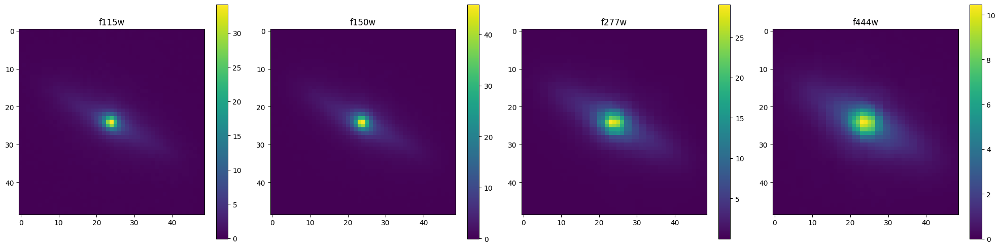

sersic radius 0.49653016768462344
id 6635


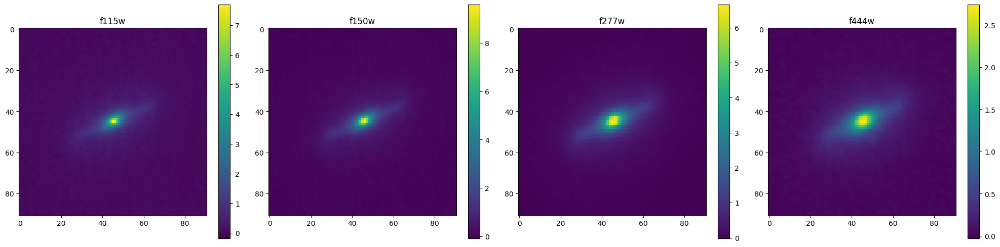

sersic radius 0.9595259074499493
id 6701


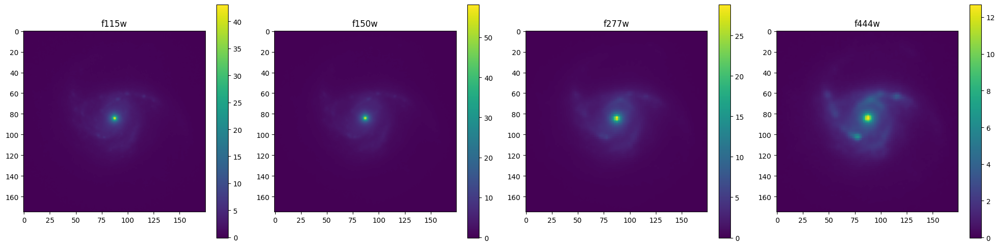

sersic radius 0.39086513743145257
id 6802


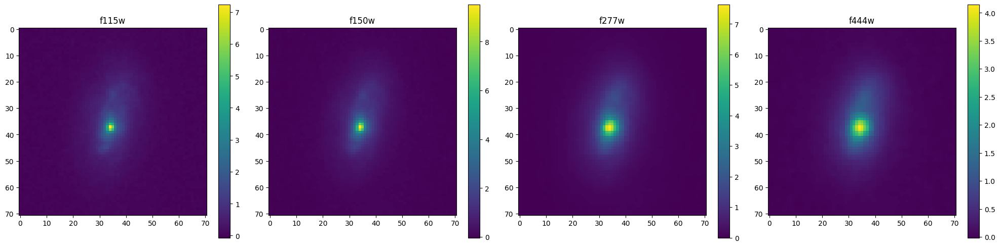

sersic radius 0.39712154180056397
id 6834


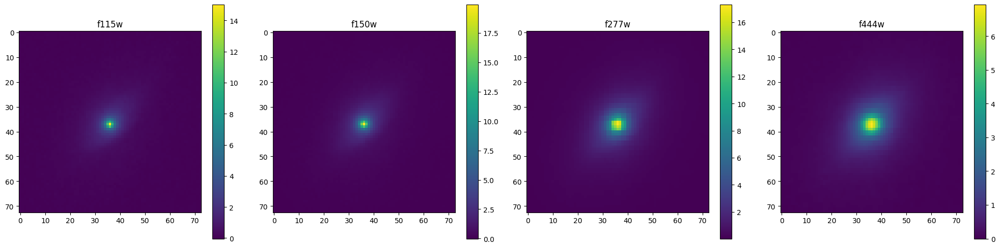

sersic radius 0.24947846341965804
id 7615


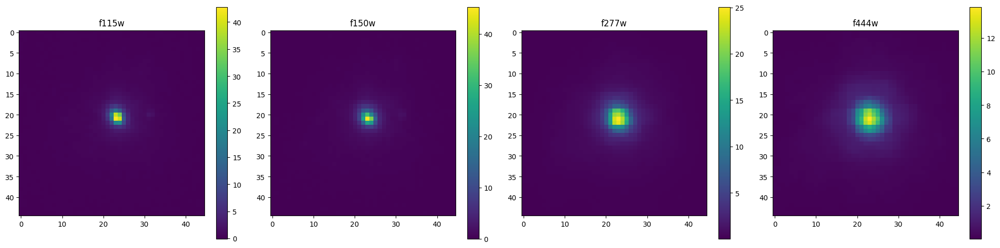

sersic radius 0.27107463337297344
id 8330


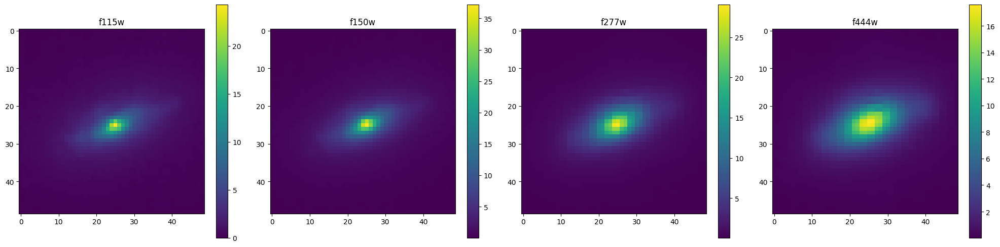

sersic radius 0.2784141956925227
id 8351


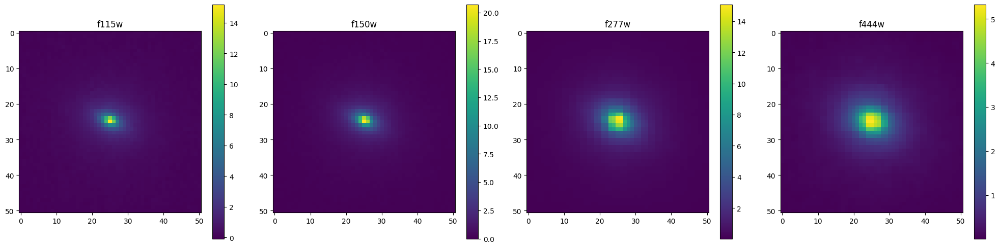

sersic radius 0.4125987684896457
id 8655


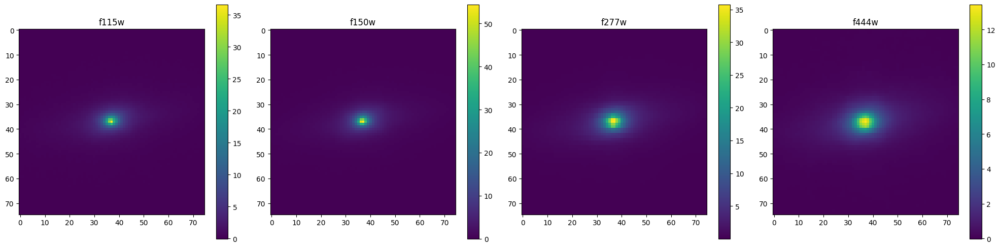

sersic radius 0.21228461684566222
id 8953


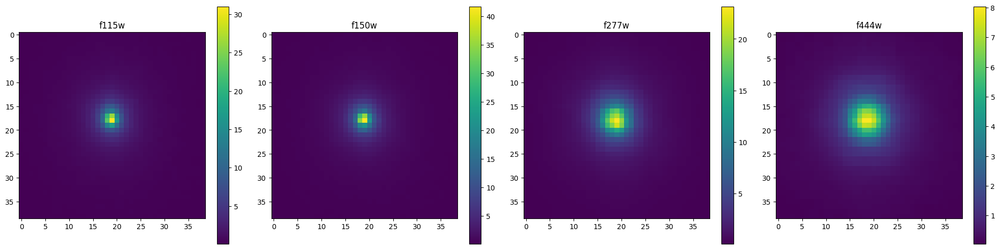

sersic radius 0.9629760054861878
id 9259


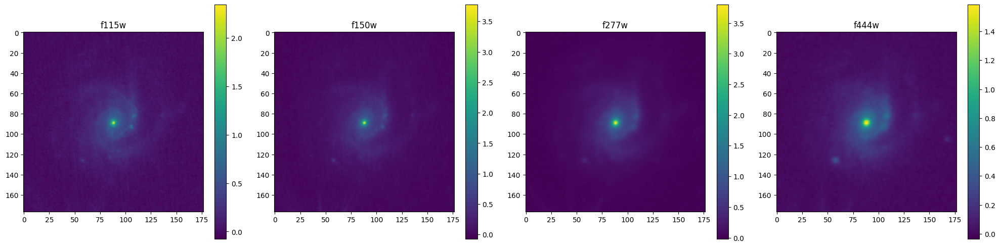

sersic radius 0.3973397642765284
id 9534


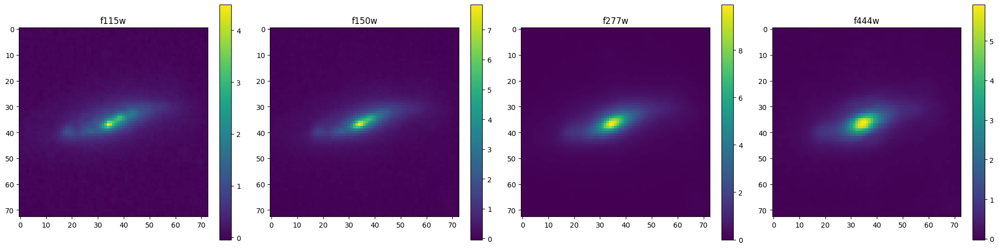

sersic radius 0.46736707078727996
id 9611


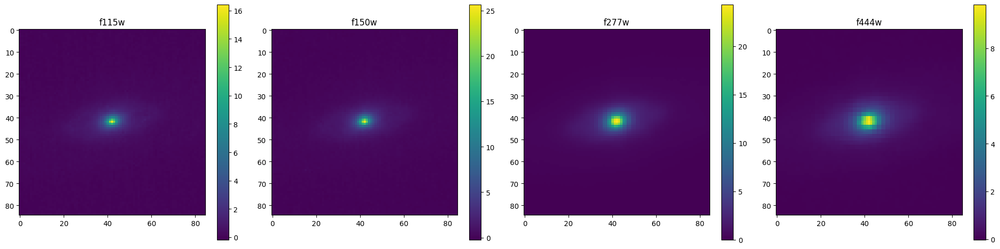

sersic radius 0.49582484965998713
id 10523


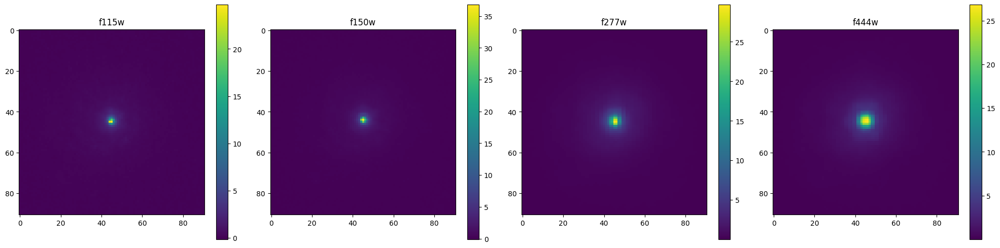

sersic radius 0.1853751247816387
id 10944


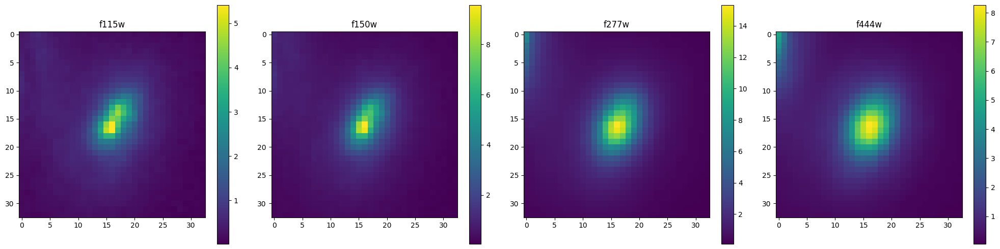

sersic radius 1.2762849595416876
id 11197


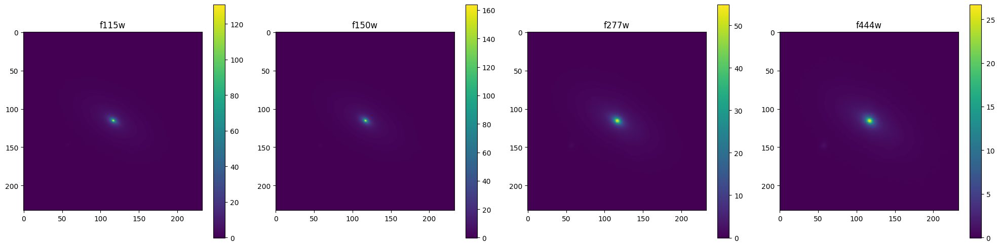

sersic radius 0.33458775914505795
id 11273


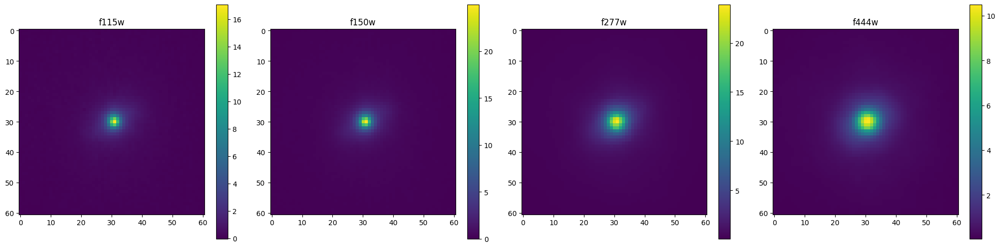

sersic radius 0.325077475224527
id 11369


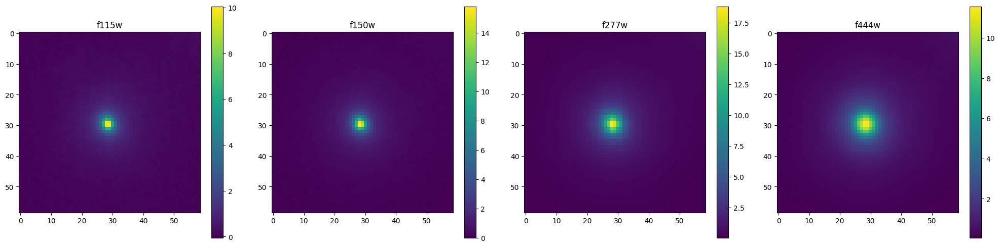

sersic radius 0.6697467111517619
id 11608


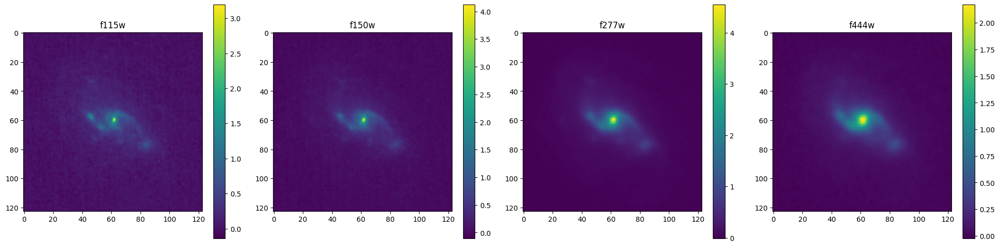

sersic radius 0.4276372214844191
id 11916


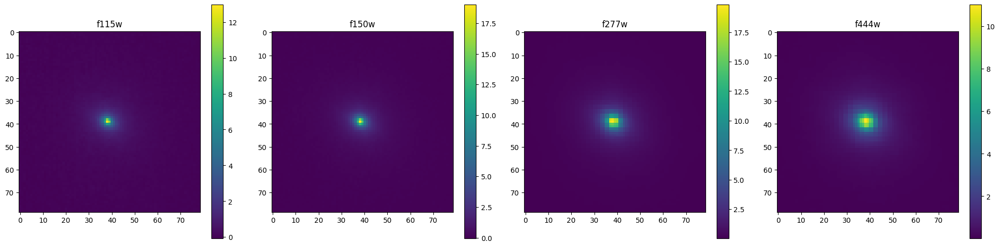

sersic radius 0.3716436553254753
id 12270


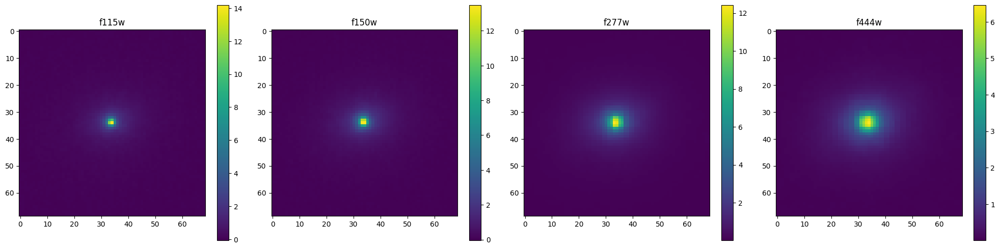

sersic radius 0.5953131644104762
id 12320


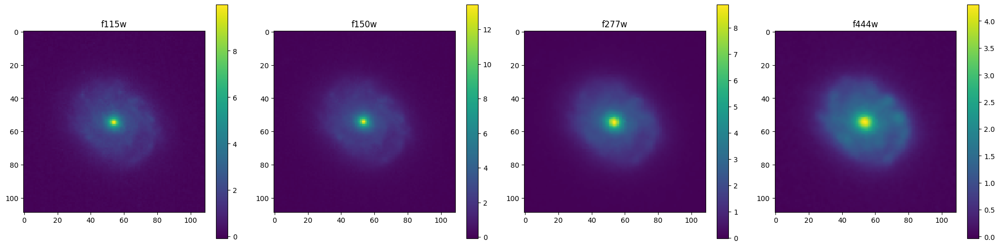

sersic radius 0.4141154918697655
id 12421


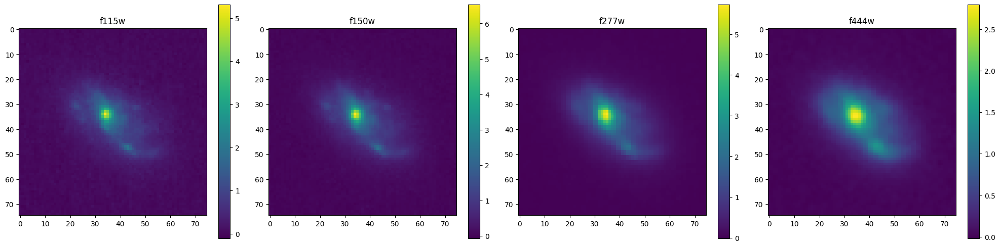

sersic radius 0.2597396300682022
id 13091


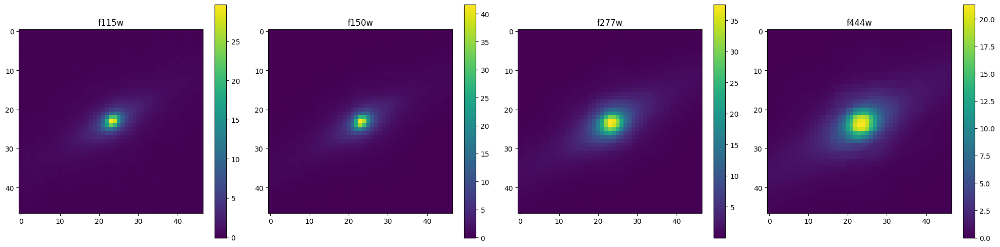

sersic radius 1.025428242660275
id 13094


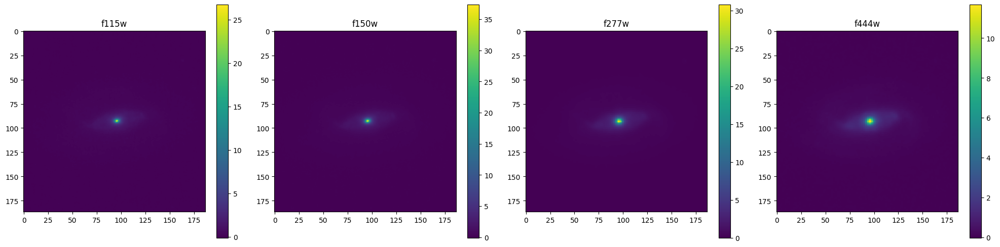

In [12]:
import matplotlib.pyplot as plt

for source in processed_catalog[:50]:
    id = source['id']
    output_filename = f"COSMOSWeb_galaxy_{id}_image.fits"
    print("sersic radius", source['sersic_radius'])
    print("id", id)

    image_file = os.path.join(output_file_directory, output_filename)

    with fits.open(image_file) as hdul:
        fig, ax = plt.subplots(1, 4, figsize=(20, 5))
        for i in range(4):
            im = ax[i].imshow(hdul[i+1].data)
            #im = ax[i].imshow(np.log10(hdul[i+1].data))
            ax[i].set_title(band_list[i])
            plt.colorbar(im, ax=ax[i])

    plt.tight_layout()
    plt.show()


### RGB Images

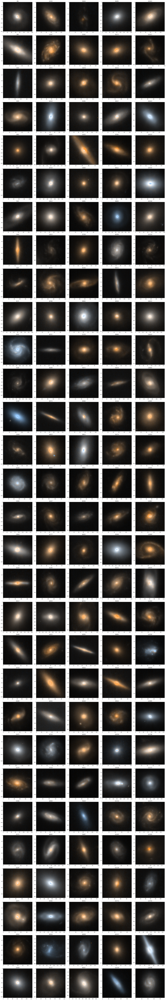

In [13]:
from astropy.visualization import make_lupton_rgb

num_rows = 30
num_cols = 5

fig, ax = plt.subplots(num_rows, num_cols, figsize=(25, int(25 * num_rows / num_cols)))
i = 0
j = 0

for source in processed_catalog[processed_catalog['sersic_radius'] > 0.5][:num_rows * num_cols]:
    id = source['id']
    output_filename = f"COSMOSWeb_galaxy_{id}_image.fits"
    image_file = os.path.join(output_file_directory, output_filename)

    with fits.open(image_file) as hdul:
        rgb = make_lupton_rgb(
            image_r=hdul[3].data,
            image_g=(hdul[3].data + hdul[2].data) / 2,
            image_b=hdul[2].data,
            stretch=2,
            Q=4,
            minimum=np.min([hdul[3].data,
                            (hdul[3].data + hdul[2].data) / 2,
                            hdul[2].data])
        )

    im = ax[i, j].imshow(rgb)
    ax[i, j].set_title(str(id))
    i += 1
    if i == num_rows:
        i = 0
        j += 1

plt.tight_layout()
plt.show()